## Import all necessary packges


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os


In [2]:
df=pd.read_csv('predictive_maintenance.csv')

In [3]:
df

,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Failure Type
0,1,M14860,M,298.1,308.6,1551,42.8,0,0,No Failure
1,2,L47181,L,298.2,308.7,1408,46.3,3,0,No Failure
2,3,L47182,L,298.1,308.5,1498,49.4,5,0,No Failure
3,4,L47183,L,298.2,308.6,1433,39.5,7,0,No Failure
4,5,L47184,L,298.2,308.7,1408,40.0,9,0,No Failure
...,...,...,...,...,...,...,...,...,...,...
9995,9996,M24855,M,298.8,308.4,1604,29.5,14,0,No Failure
9996,9997,H39410,H,298.9,308.4,1632,31.8,17,0,No Failure
9997,9998,M24857,M,299.0,308.6,1645,33.4,22,0,No Failure
9998,9999,H39412,H,299.0,308.7,1408,48.5,25,0,No Failure


### Print a sample of 10 random rows fro the dataframe

In [9]:
df.sample(10)

,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Failure Type
3113,3114,M17973,M,299.9,309.1,1345,56.8,10,0,No Failure
8283,8284,H37697,H,298.9,310.6,1615,33.0,221,0,No Failure
494,495,L47674,L,297.6,309.4,1326,49.8,199,0,No Failure
2228,2229,H31642,H,299.4,308.6,1542,41.8,166,0,No Failure
6319,6320,L53499,L,300.8,310.2,1514,40.0,155,0,No Failure
8432,8433,L55612,L,298.8,310.0,1537,39.9,190,0,No Failure
2073,2074,L49253,L,299.6,309.4,1677,31.1,191,0,No Failure
9933,9934,L57113,L,298.3,308.3,1597,32.4,69,0,No Failure
9888,9889,M24748,M,298.8,309.6,1575,34.4,149,0,No Failure
5722,5723,L52902,L,302.2,311.7,1488,44.6,178,0,No Failure


### Check the null values

In [10]:
has_null=df.isnull().values.any()

In [11]:
print("Are there any null values?",has_null)

Are there any null values? False


### Count the null values

In [14]:
null_counts = df.isnull().sum()
print("Null values per column:\n", null_counts)


Null values per column:
 UDI                        0
Product ID                 0
Type                       0
Air temperature [K]        0
Process temperature [K]    0
Rotational speed [rpm]     0
Torque [Nm]                0
Tool wear [min]            0
Target                     0
Failure Type               0
dtype: int64


### Check Duplicates

In [19]:
df.duplicated().sum()

0

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 10 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   UDI                      10000 non-null  int64  
 1   Product ID               10000 non-null  object 
 2   Type                     10000 non-null  object 
 3   Air temperature [K]      10000 non-null  float64
 4   Process temperature [K]  10000 non-null  float64
 5   Rotational speed [rpm]   10000 non-null  int64  
 6   Torque [Nm]              10000 non-null  float64
 7   Tool wear [min]          10000 non-null  int64  
 8   Target                   10000 non-null  int64  
 9   Failure Type             10000 non-null  object 
dtypes: float64(3), int64(4), object(3)
memory usage: 781.4+ KB


## Distribution Plot

In [10]:
df_numeric=df.select_dtypes(include=['int','float'])
print(df_numeric.columns)

Index(['UDI', 'Air temperature [K]', 'Process temperature [K]',
       'Rotational speed [rpm]', 'Torque [Nm]', 'Tool wear [min]', 'Target'],
      dtype='object')


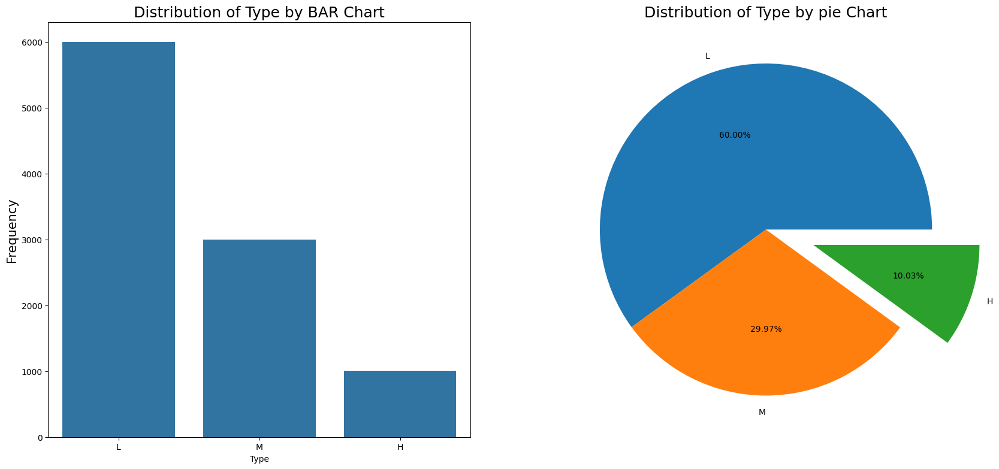

In [14]:
fig,ax=plt.subplots(ncols=2,nrows=1,figsize=(20,9))

#ax[0]
ax[0].set_title("Distribution of Type by BAR Chart",fontdict={"size":18})
figure=sns.countplot(x=df.Type,ax=ax[0],order=["L", "M", "H"])
for container in figure.containers:
    ax[0].set_ylabel("Frequency",fontdict={"size":15})

#ax[1]
ax[1].set_title("Distribution of Type by pie Chart",fontdict={"size":18})
ax[1].pie(x=df.Type.value_counts().values,labels=df.Type.value_counts().index,autopct='%1.2f%%', explode=[0,0,0.3])
plt.show()


In [6]:
#Numerical Columns
df.select_dtypes(["float","int"])

,UDI,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target
0,1,298.1,308.6,1551,42.8,0,0
1,2,298.2,308.7,1408,46.3,3,0
2,3,298.1,308.5,1498,49.4,5,0
3,4,298.2,308.6,1433,39.5,7,0
4,5,298.2,308.7,1408,40.0,9,0
...,...,...,...,...,...,...,...
9995,9996,298.8,308.4,1604,29.5,14,0
9996,9997,298.9,308.4,1632,31.8,17,0
9997,9998,299.0,308.6,1645,33.4,22,0
9998,9999,299.0,308.7,1408,48.5,25,0


In [5]:
# Numeric Variable
def plot_hist(variable):
    plt.figure(figsize =(6,3))
    plt.hist(df[variable],bins=50)
    plt.xlabel(variable)
    plt.ylabel("Frequency")
    plt.title("{}distribution with hist".format(variable))
    plt.show()

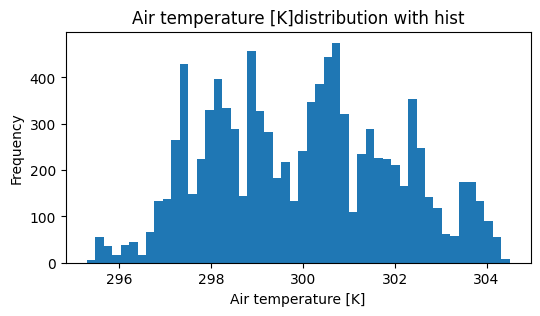

<Figure size 640x480 with 0 Axes>

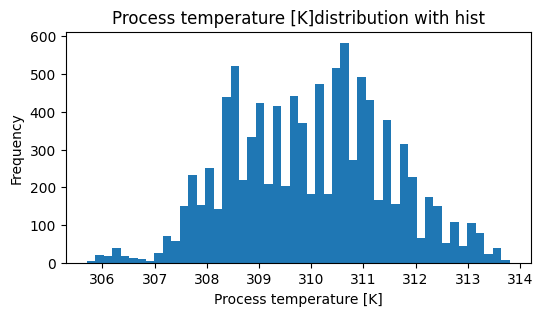

<Figure size 640x480 with 0 Axes>

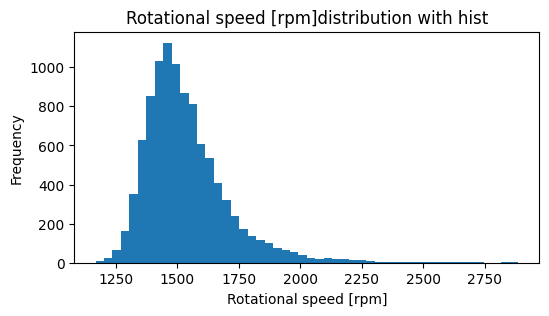

<Figure size 640x480 with 0 Axes>

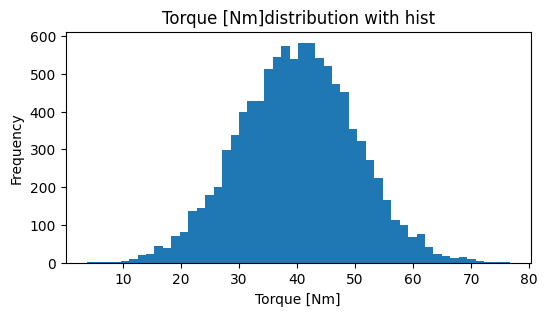

<Figure size 640x480 with 0 Axes>

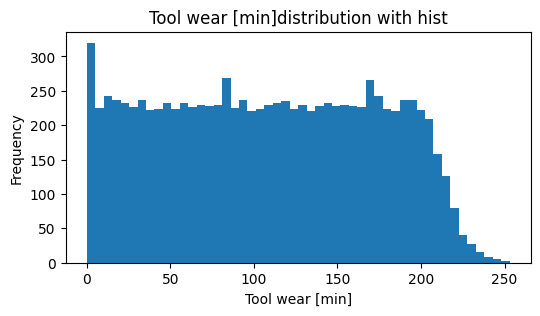

<Figure size 640x480 with 0 Axes>

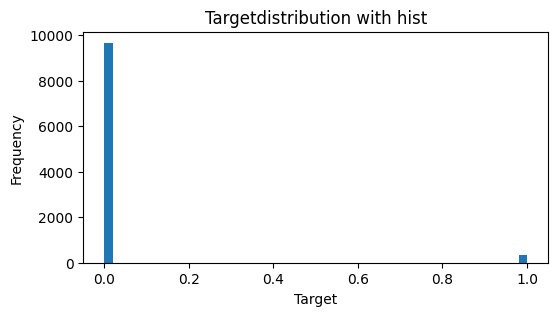

<Figure size 640x480 with 0 Axes>

In [6]:
category1=['Air temperature [K]', 'Process temperature [K]','Rotational speed [rpm]','Torque [Nm]', 'Tool wear [min]', 'Target']
for c in category1:
    plot_hist(c)
    plt.tight_layout()
    plt.show()

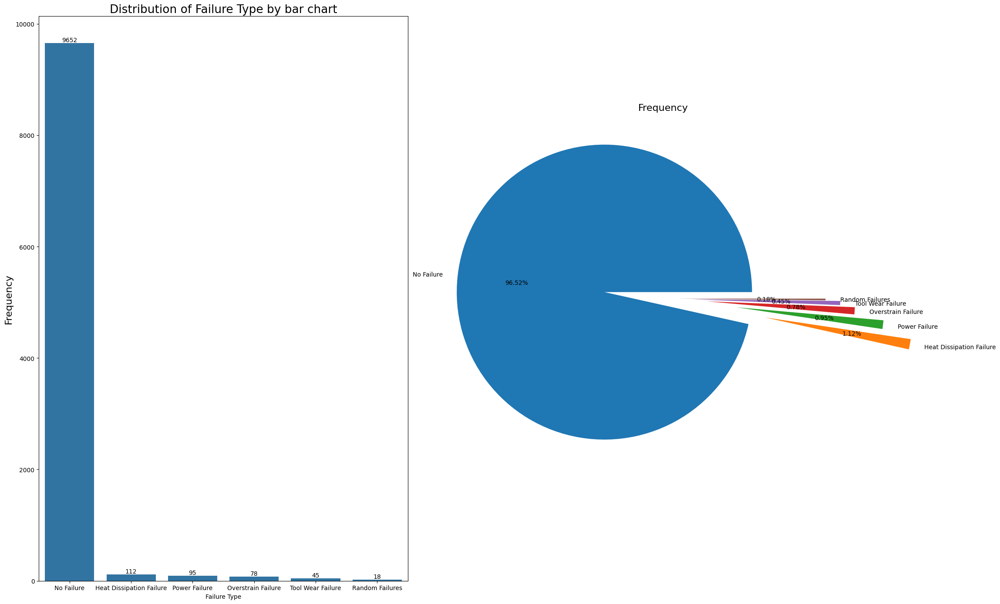

In [12]:
fig, ax = plt.subplots(ncols=2, nrows=1, figsize=(23,14))

# ax[0]
ax[0].set_title("Distribution of Failure Type by bar chart",fontdict={"size":19})
figure = sns.countplot(x=df["Failure Type"],ax=ax[0],order=df["Failure Type"].value_counts().index)
for container in figure.containers:
    figure.bar_label(container)
ax[0].set_ylabel("Frequency",fontdict={"size":16})

#ax[1]
ax[1].set_title("Frequency",fontdict={"size":16})
ax[1].pie(x=df["Failure Type"]. value_counts().values,
          labels=df["Failure Type"].value_counts().index,
          autopct='%1.2f%%',explode=[.4,0.7,0.5,.3,.2,0.1])
plt.tight_layout()
plt.show()

In [10]:
#Class distribution
df['Failure Type'].value_counts()

Failure Type
No Failure                  9652
Heat Dissipation Failure     112
Power Failure                 95
Overstrain Failure            78
Tool Wear Failure             45
Random Failures               18
Name: count, dtype: int64

### Feature by target

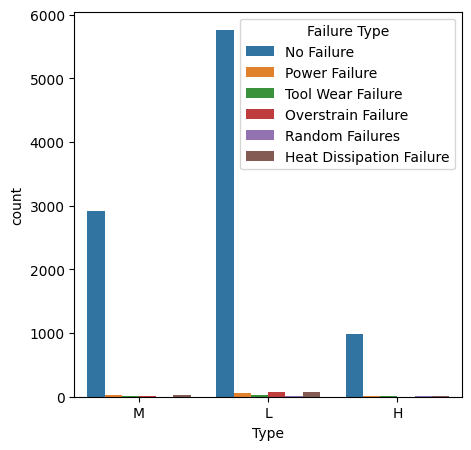

In [13]:
columns=['Type']
plt.figure(figsize=(5,5))
sns.countplot(x='Type',data=df,hue='Failure Type')
plt.show()
         

### Because column UDI and product ID isn't necessary so drop it


In [14]:
df=df.drop(columns=['UDI','Product ID','Target'])
df.head()

,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Failure Type
0,M,298.1,308.6,1551,42.8,0,No Failure
1,L,298.2,308.7,1408,46.3,3,No Failure
2,L,298.1,308.5,1498,49.4,5,No Failure
3,L,298.2,308.6,1433,39.5,7,No Failure
4,L,298.2,308.7,1408,40.0,9,No Failure


### Convert categorial to numerical features

In [17]:
from sklearn.preprocessing import LabelEncoder

In [16]:
!pip install scikit-learn


Defaulting to user installation because normal site-packages is not writeable
   ---------------------------------------- 0.0/11.0 MB ? eta -:--:--
   ---- ----------------------------------- 1.3/11.0 MB 6.7 MB/s eta 0:00:02
   -------- ------------------------------- 2.4/11.0 MB 6.1 MB/s eta 0:00:02
   ---------------- ----------------------- 4.5/11.0 MB 7.3 MB/s eta 0:00:01
   ---------------------- ----------------- 6.3/11.0 MB 7.7 MB/s eta 0:00:01
   --------------------------- ------------ 7.6/11.0 MB 7.5 MB/s eta 0:00:01
   --------------------------------- ------ 9.2/11.0 MB 7.5 MB/s eta 0:00:01
   ---------------------------------------  10.7/11.0 MB 7.6 MB/s eta 0:00:01
   ---------------------------------------- 11.0/11.0 MB 7.4 MB/s eta 0:00:00
   ---------------------------------------- 0.0/44.5 MB ? eta -:--:--
   - -------------------------------------- 1.6/44.5 MB 8.4 MB/s eta 0:00:06
   --- ------------------------------------ 3.4/44.5 MB 8.8 MB/s eta 0:00:05
   ---- --

DEPRECATION: Loading egg at c:\program files\python312\lib\site-packages\vboxapi-1.0-py3.12.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


### Applying label encoding to each categorical column

In [21]:
label_encoder=LabelEncoder()
for column in df.select_dtypes(include=['object']).columns:
    df[column]=label_encoder.fit_transform(df[column])

In [22]:
correlation_matrix=df.corr()
print(correlation_matrix)

                             Type  Air temperature [K]  \
Type                     1.000000             0.017599   
Air temperature [K]      0.017599             1.000000   
Process temperature [K]  0.013444             0.876107   
Rotational speed [rpm]  -0.002693             0.022670   
Torque [Nm]              0.004011            -0.013778   
Tool wear [min]         -0.003930             0.013853   
Failure Type            -0.008249            -0.025327   

                         Process temperature [K]  Rotational speed [rpm]  \
Type                                    0.013444               -0.002693   
Air temperature [K]                     0.876107                0.022670   
Process temperature [K]                 1.000000                0.019277   
Rotational speed [rpm]                  0.019277                1.000000   
Torque [Nm]                            -0.014061               -0.875027   
Tool wear [min]                         0.013488                0.000223   
Fai

### Visualize the coorelation matrix as heatmap

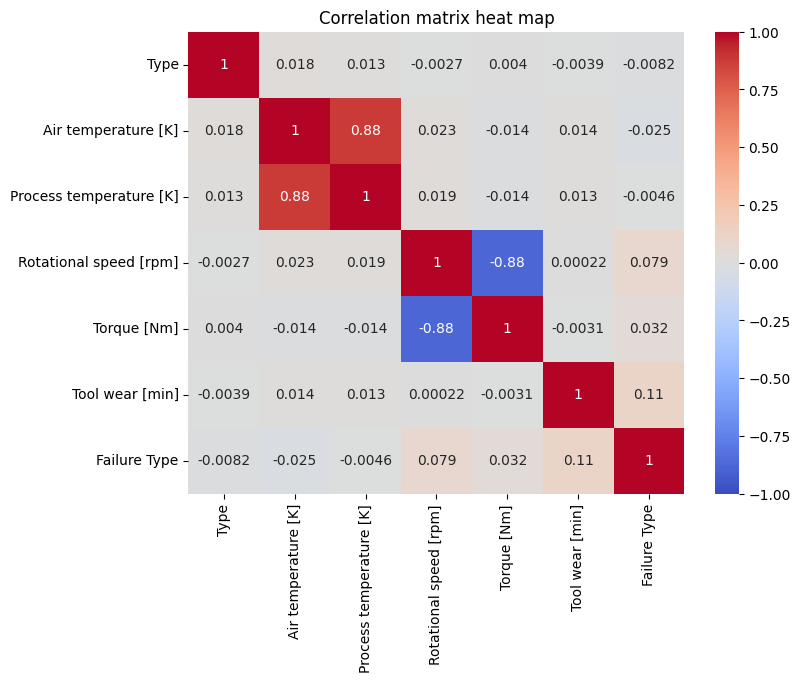

In [25]:
plt.figure(figsize=(8,6))
sns.heatmap(correlation_matrix,annot=True,cmap='coolwarm',vmin=-1,vmax=1)
plt.title("Correlation matrix heat map")
plt.show()

### Visualize the distribution of rotational speeds for different product types.

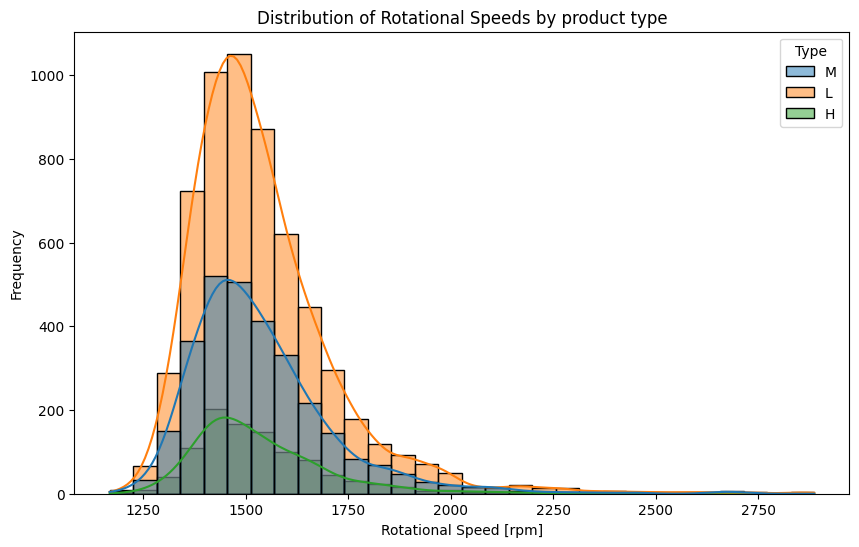

In [8]:
plt.figure(figsize=(10,6))
sns.histplot(data=df,x='Rotational speed [rpm]',hue='Type',kde=True,bins=30)
plt.title('Distribution of Rotational Speeds by product type')
plt.xlabel('Rotational Speed [rpm]')
plt.ylabel('Frequency')
plt.show()


### Analyze the relationship between torque and rotational speed using scatter plots.

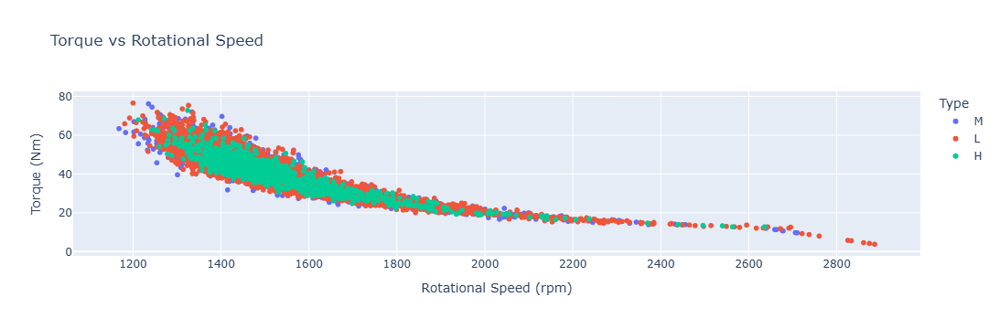

In [15]:
import plotly.express as px

# Corrected scatter plot
fig = px.scatter(
    df,  
    x='Rotational speed [rpm]', 
    y='Torque [Nm]', 
    color='Type',
    title='Torque vs Rotational Speed',
    labels={'Rotational speed [rpm]': 'Rotational Speed (rpm)', 'Torque [Nm]': 'Torque (Nm)'}
)
fig.show()


### Find the percentage contribution of each failure type and visualize it using a pie chart.

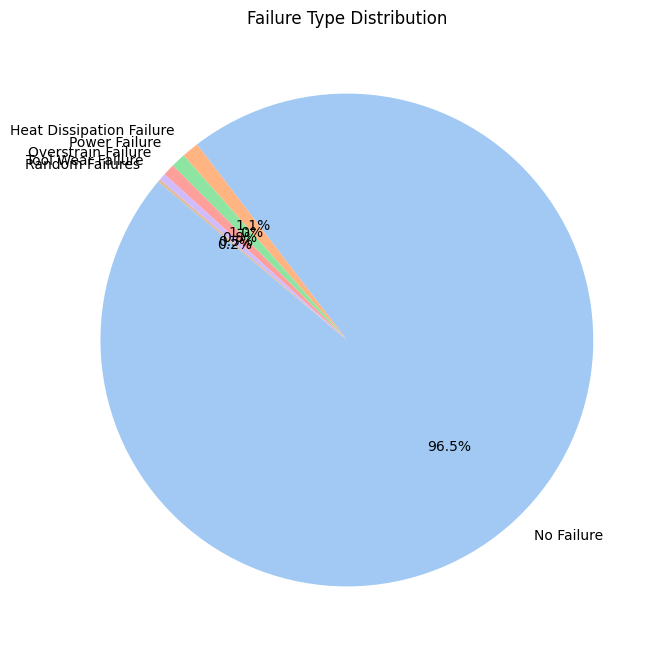

In [6]:
#Calculate the percentage contribution of each failure type
failure_counts=df['Failure Type'].value_counts(normalize=True)*100

# pie chart using Matplotlib
plt.figure(figsize=(8,8))
plt.pie(failure_counts, labels=failure_counts.index,autopct='%1.1f%%', startangle=140, colors=sns.color_palette('pastel'))
plt.title('Failure Type Distribution')
plt.show()

### Compare average process temperatures for different failure types using a bar plot.

C:\Users\rammi\AppData\Local\Temp\ipykernel_83468\4092953868.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=avg_process_temp.index,y=avg_process_temp.values,palette='viridis')


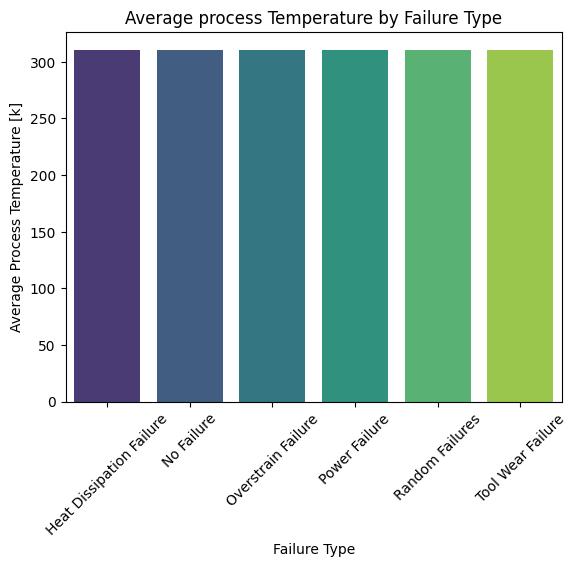

In [14]:
# Group by failure type and calculate mean process temperature
avg_process_temp=df.groupby('Failure Type')['Process temperature [K]'].mean()

#Bar plot using seaborn
plt.Figure(figsize=(10,6))
sns.barplot(x=avg_process_temp.index,y=avg_process_temp.values,palette='viridis')
plt.title('Average process Temperature by Failure Type')
plt.xlabel('Failure Type')
plt.ylabel('Average Process Temperature [k]')
plt.xticks(rotation=45)
plt.show()

### Create a heatmap to analyze correlations among numerical variables.

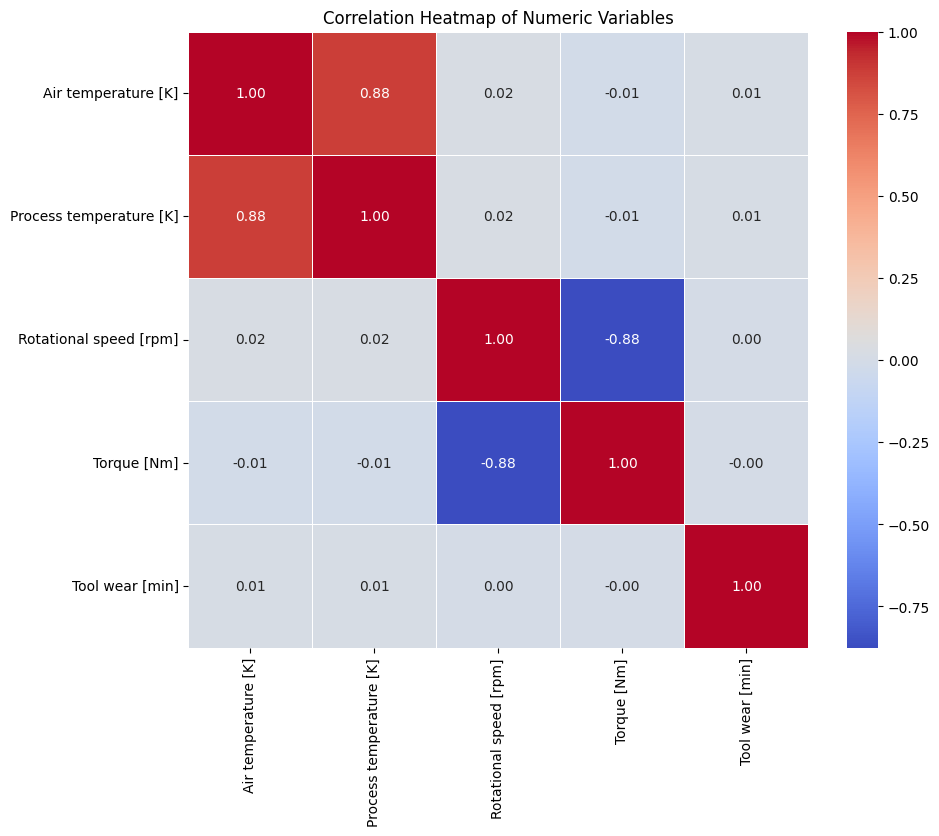

In [6]:
# Calculate the correlation matrix
correlation_matrix=df[['Air temperature [K]', 'Process temperature [K]','Rotational speed [rpm]','Torque [Nm]','Tool wear [min]']].corr()

#Heat map using seaborn
plt.figure(figsize=(10,8))
sns.heatmap(correlation_matrix,annot=True, cmap='coolwarm', fmt=".2f",linewidth=0.5)
plt.title('Correlation Heatmap of Numeric Variables')
plt.show()

### Visualize tool wear over time for products that experienced a tool wear failure.

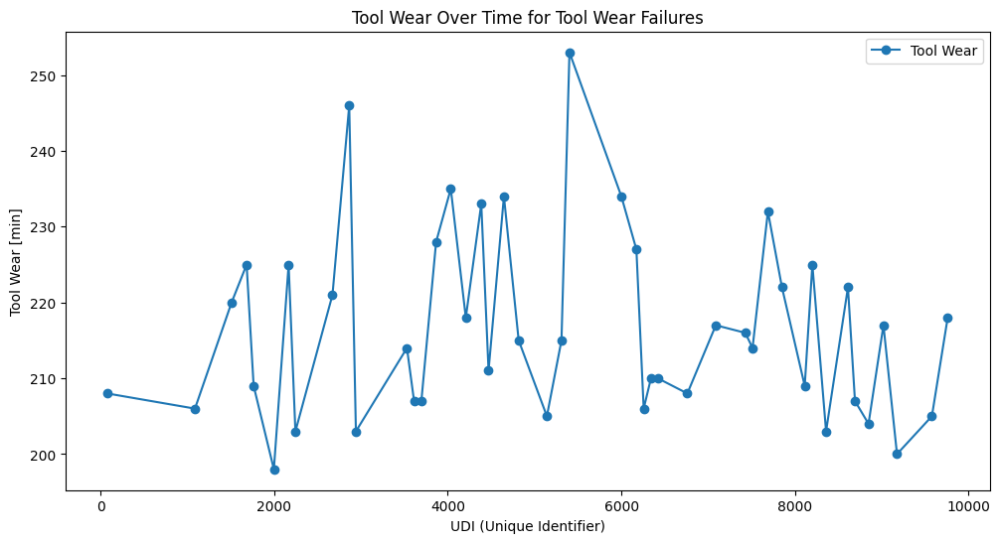

In [11]:
# Filter the data for toolwear failures
tool_wear_failures=df[df['Failure Type']=='Tool Wear Failure']

#Line plot using matplotlib
plt.figure(figsize=(12,6))
plt.plot(tool_wear_failures['UDI'], tool_wear_failures['Tool wear [min]' ], label='Tool Wear', marker='o')
plt.title('Tool Wear Over Time for Tool Wear Failures')
plt.xlabel('UDI (Unique Identifier)')
plt.ylabel('Tool Wear [min]')
plt.legend()
plt.show()

### Analyze the distribution of air temperatures for failed and non-failed products.

C:\Users\rammi\AppData\Local\Temp\ipykernel_39016\3752886622.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=df, x= 'Air temperature [K]', hue='Failure Binary', shade=True,palette='muted')


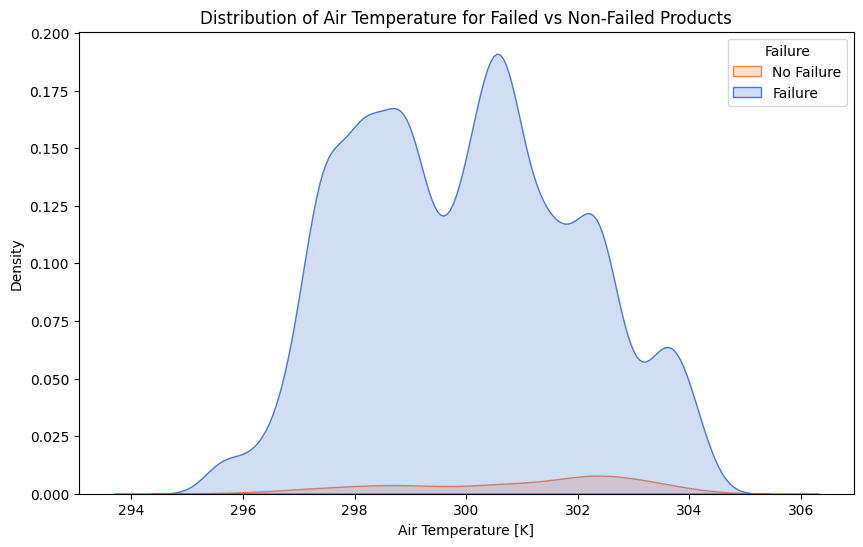

In [13]:
# Add a binary column for failure(1 for failure , 0 for failure)
df['Failure Binary']=df['Failure Type'].apply(lambda x: 0 if x == 'No Failure' else 1)

#KDE plot using seaborn
plt.figure(figsize=(10,6))
sns.kdeplot(data=df, x= 'Air temperature [K]', hue='Failure Binary', shade=True,palette='muted')
plt.title('Distribution of Air Temperature for Failed vs Non-Failed Products')
plt.xlabel('Air Temperature [K]')
plt.ylabel('Density')
plt.legend(title='Failure', labels=['No Failure', 'Failure'])
plt.show()



### Analyze the trend of rotational speed over air temperature using a line plot.

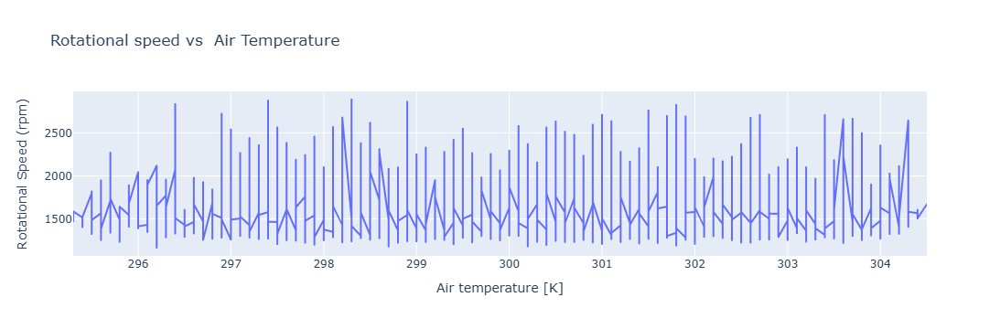

In [24]:
#Sort by Air temperature for smother visualization
import plotly.express as px
data_sorted=df.sort_values('Air temperature [K]')

#Line plot using plotly
fig = px.line(data_sorted, x='Air temperature [K]', y='Rotational speed [rpm]',
             title='Rotational speed vs  Air Temperature',
             labels={'Air Temperature [K]': 'Air Temperature (K)', 'Rotational speed [rpm]': 'Rotational Speed (rpm)'})
fig.show()             
             
            

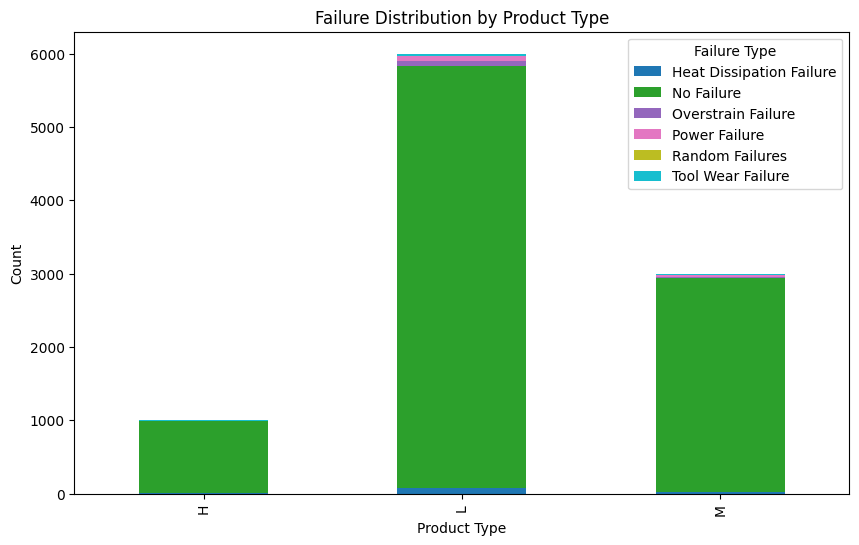

In [4]:
# Create a pivot table
failure_distribution = df.pivot_table(index='Type', columns='Failure Type', aggfunc='size', fill_value=0)

# Plot the stacked bar chart
failure_distribution.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='tab10')
plt.title('Failure Distribution by Product Type')
plt.xlabel('Product Type')
plt.ylabel('Count')
plt.legend(title='Failure Type')
plt.show()


### Calculate and Plot Cumulative Tool Wear

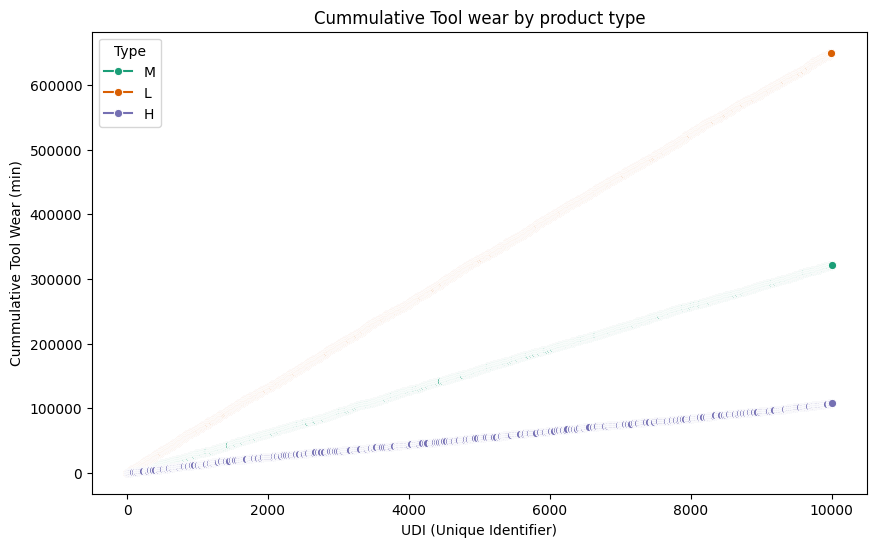

In [8]:
# Cummulative tool wear by type
cummulative_wear = df.groupby('Type')['Tool wear [min]'].cumsum()

#Add to DataFrame
df['Cummulative Tool Wear']=cummulative_wear

#Plot using Seaborn
plt.figure(figsize=(10,6))
sns.lineplot(data=df, x='UDI', y='Cummulative Tool Wear', hue='Type', marker='o', palette='Dark2')
plt.title('Cummulative Tool wear by product type')
plt.xlabel('UDI (Unique Identifier)')
plt.ylabel('Cummulative Tool Wear (min)')
plt.show()

### Compare mean Air temperature by Failure Type

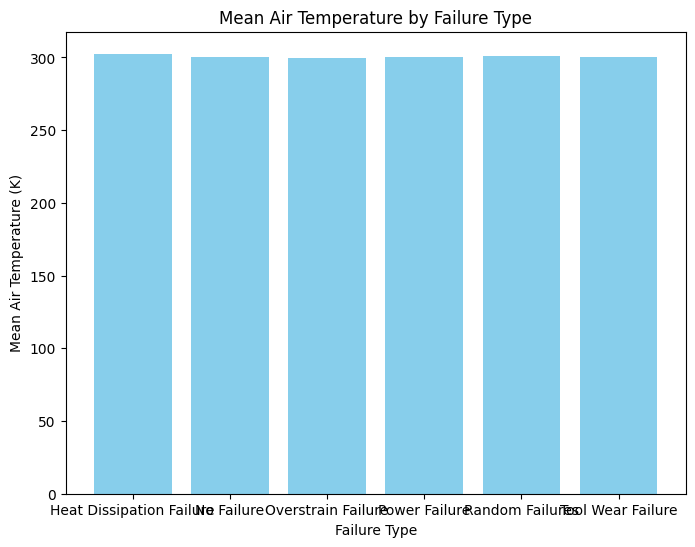

In [10]:
#Mean Air Temperature by failure type
mean_air_temp=df.groupby('Failure Type')['Air temperature [K]'].mean()

#Bar plot using matplotlib
plt.figure(figsize=(8,6))
plt.bar(mean_air_temp.index,mean_air_temp.values,color='skyblue')
plt.title('Mean Air Temperature by Failure Type')
plt.xlabel('Failure Type')
plt.ylabel('Mean Air Temperature (K)')
plt.show()

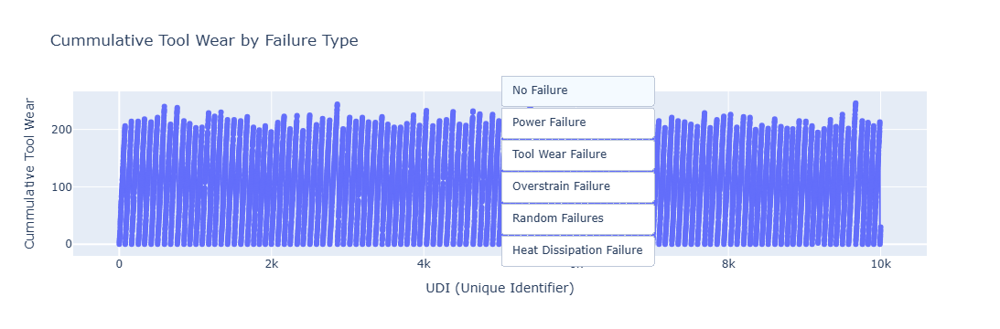

In [4]:
import plotly.graph_objects as go

# Group data by 'Failure Type'
failure_types = df['Failure Type'].unique()
fig = go.Figure()

# Create traces for each failure type
for failure_type in failure_types:
    filtered_data = df[df['Failure Type'] == failure_type]
    fig.add_trace(go.Scatter(
        x=filtered_data['UDI'],
        y=filtered_data['Tool wear [min]'],
        mode='lines+markers',
        name=failure_type,
        visible=False  # Initially hide all traces
    ))

# Show the first trace (initial view)
fig.data[0].visible = True

# Create buttons for each failure type
buttons = []
for i, failure_type in enumerate(failure_types):
    button = dict(
        label=failure_type,
        method="update",
        args=[{"visible": [j == i for j in range(len(failure_types))]},
              {"title": f"Cummulative Tool Wear for {failure_type}"}]
    )
    buttons.append(button)

# Update layout with dropdown buttons
fig.update_layout(
    updatemenus=[
        dict(
            type="buttons",
            direction="down",
            buttons=buttons,
            showactive=True,
            x=0.5,
            xanchor="left",
            y=1.1,
            yanchor="top"
        )
    ],
    title="Cummulative Tool Wear by Failure Type",
    xaxis_title="UDI (Unique Identifier)",
    yaxis_title="Cummulative Tool Wear",
    template="plotly"
)

# Display the figure
fig.show()


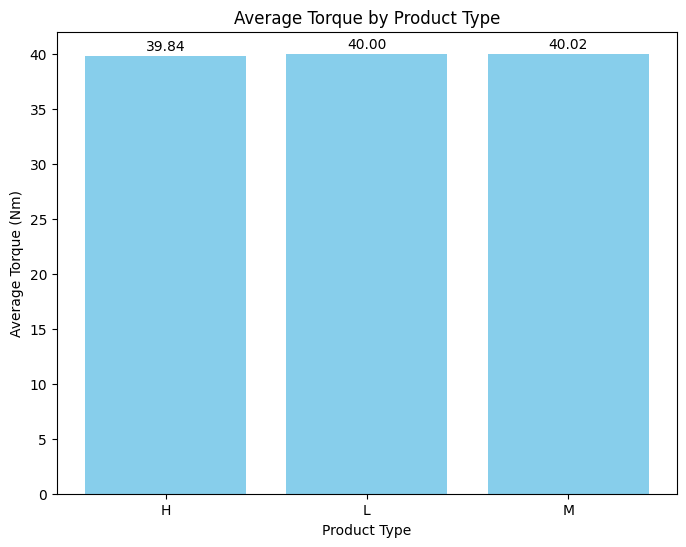

In [10]:
# Calculate average torque by product type
avg_torque = df.groupby('Type')['Torque [Nm]'].mean()

# Bar Plot of Average Torque by Type
plt.figure(figsize=(8, 6))
bars = plt.bar(avg_torque.index, avg_torque, color='skyblue')

# Annotate Each Bar
for bar in bars:
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + 0.5,
        f'{bar.get_height():.2f}',
        ha='center', fontsize=10
    )

plt.title("Average Torque by Product Type")
plt.xlabel("Product Type")
plt.ylabel("Average Torque (Nm)")
plt.show()


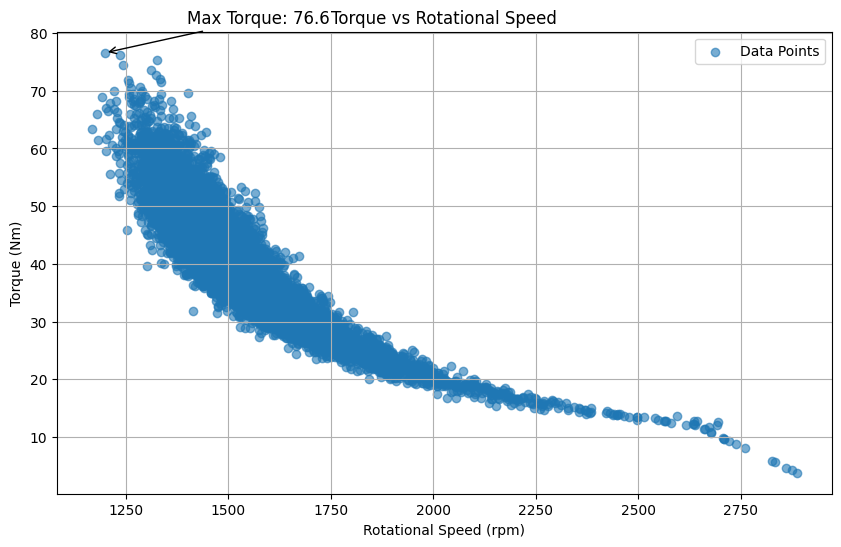

In [11]:
# Scatter Plot of Rotational Speed vs Torque
plt.figure(figsize=(10, 6))
plt.scatter(df['Rotational speed [rpm]'], df['Torque [Nm]'], alpha=0.6, label="Data Points")

# Annotate a specific point (e.g., maximum torque)
max_torque = df['Torque [Nm]'].max()
max_speed = df.loc[df['Torque [Nm]'].idxmax(), 'Rotational speed [rpm]']

plt.annotate(
    f'Max Torque: {max_torque}', 
    xy=(max_speed, max_torque), 
    xytext=(max_speed + 200, max_torque + 5),
    arrowprops=dict(facecolor='green', arrowstyle='->'),
    fontsize=12
)

plt.title("Torque vs Rotational Speed")
plt.xlabel("Rotational Speed (rpm)")
plt.ylabel("Torque (Nm)")
plt.grid()
plt.legend()
plt.show()
